## DATA PREPARATION

In this notebook, we will use [MovieLens DataSet](https://grouplens.org/datasets/movielens/). This version of the dataset ([1M](https://grouplens.org/datasets/movielens/1m/)) contains 1,000,209 anonymous ratings of approximately 3,900 movies made by 6,040 MovieLens users who joined MovieLens in 2000.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


movies = pd.read_csv('movies.csv', sep='\t', encoding='latin-1', usecols=['movie_id', 'title', 'genres'])

users = pd.read_csv('users.csv', sep='\t', encoding='latin-1', usecols=['user_id', 'gender', 'zipcode', 'age_desc', 'occ_desc'])

ratings = pd.read_csv('ratings.csv', sep='\t', encoding='latin-1', usecols=['user_id', 'movie_id', 'rating'])


### Movies Dataset

In [7]:
movies.head()

,movie_id,title,genres
0,1,Toy Story (1995),Animation|Children's|Comedy
1,2,Jumanji (1995),Adventure|Children's|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama
4,5,Father of the Bride Part II (1995),Comedy


In [8]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3883 entries, 0 to 3882
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   movie_id  3883 non-null   int64 
 1   title     3883 non-null   object
 2   genres    3883 non-null   object
dtypes: int64(1), object(2)
memory usage: 91.1+ KB


### Users Dataset

In [9]:
users.head()

,user_id,gender,zipcode,age_desc,occ_desc
0,1,F,48067,Under 18,K-12 student
1,2,M,70072,56+,self-employed
2,3,M,55117,25-34,scientist
3,4,M,02460,45-49,executive/managerial
4,5,M,55455,25-34,writer


In [10]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6040 entries, 0 to 6039
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   user_id   6040 non-null   int64 
 1   gender    6040 non-null   object
 2   zipcode   6040 non-null   object
 3   age_desc  6040 non-null   object
 4   occ_desc  6040 non-null   object
dtypes: int64(1), object(4)
memory usage: 236.1+ KB


### Ratings Dataset

In [11]:
ratings.head()

,user_id,movie_id,rating
0,1,1193,5
1,1,661,3
2,1,914,3
3,1,3408,4
4,1,2355,5


In [12]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000209 entries, 0 to 1000208
Data columns (total 3 columns):
 #   Column    Non-Null Count    Dtype
---  ------    --------------    -----
 0   user_id   1000209 non-null  int64
 1   movie_id  1000209 non-null  int64
 2   rating    1000209 non-null  int64
dtypes: int64(3)
memory usage: 22.9 MB


## EDA

#### Movie Titles

Let take a look at some common word in the movie title using Word-Cloud visualization

<function matplotlib.pyplot.show(close=None, block=None)>

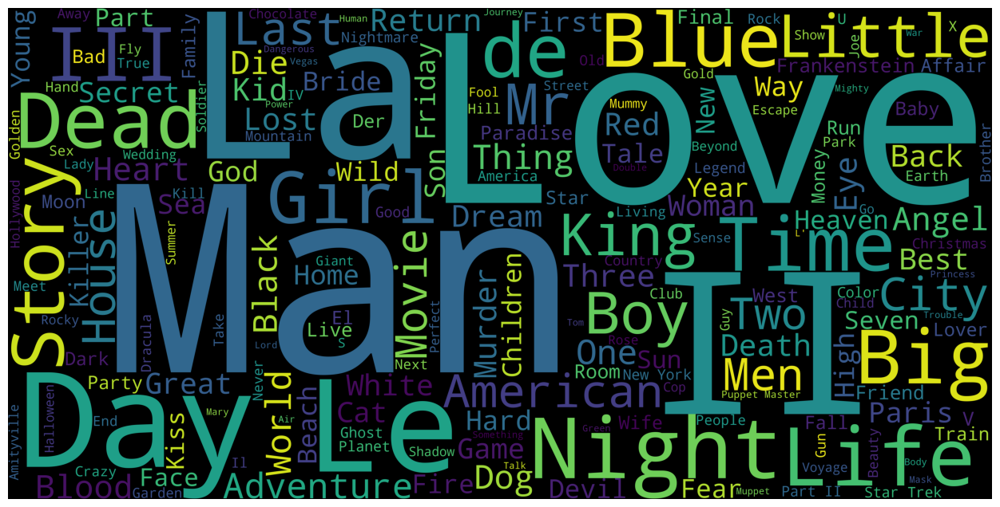

In [20]:
import wordcloud
from wordcloud import WordCloud, STOPWORDS

title_soup = ' '.join(movies['title'])
title_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='black', height=2000, width=4000).generate(title_soup)

plt.figure(figsize=(16,8))
plt.imshow(title_wordcloud)
plt.axis('off')
plt.show


The most common word appeared in the titles is *Man, Love, Day, Night*, quite interesting that the appear of symbol *II* representing the sequels also consider as one of the most common UwU.

#### Ratings

Lets have an overview of the ratings

In [23]:
ratings['rating'].describe()

count    1.000209e+06
mean     3.581564e+00
std      1.117102e+00
min      1.000000e+00
25%      3.000000e+00
50%      4.000000e+00
75%      4.000000e+00
max      5.000000e+00
Name: rating, dtype: float64

The mean ratings out of 1M ratings is 3.5, this means most reviews are posivite

Now take a look at the distribution

In [35]:
import plotly.express as px

fig = px.histogram(ratings, x = 'rating')
fig.show()

We can see most of ratings are 4-5, but what are the most rated movies ?

Let's also take a look at top 20 rated movies

In [45]:
movie_ratings = ratings[ratings.rating>=4].groupby('movie_id')['rating'].count()
merged_df = pd.merge(movies, movie_ratings, on='movie_id')
top_20_movies = merged_df.sort_values(by='rating', ascending=False).head(20)
top_20_movies

,movie_id,title,genres,rating
2526,2858,American Beauty (1999),Comedy|Drama,2853
245,260,Star Wars: Episode IV - A New Hope (1977),Action|Adventure|Fantasy|Sci-Fi,2622
1041,1196,Star Wars: Episode V - The Empire Strikes Back...,Action|Adventure|Drama|Sci-Fi|War,2510
1754,2028,Saving Private Ryan (1998),Action|Drama|War,2260
1043,1198,Raiders of the Lost Ark (1981),Action|Adventure,2260
563,593,"Silence of the Lambs, The (1991)",Drama|Thriller,2252
2260,2571,"Matrix, The (1999)",Action|Sci-Fi|Thriller,2171
2434,2762,"Sixth Sense, The (1999)",Thriller,2163
1055,1210,Star Wars: Episode VI - Return of the Jedi (1983),Action|Adventure|Romance|Sci-Fi|War,2127
575,608,Fargo (1996),Crime|Drama|Thriller,2074


This is the list of the top 20 movies with the most 4-5 stars rating. We can see there is a lot of Star Wars series :DD

#### Genres

The Genres is an important values when building the recommendation system, because it describes which type of movie it belongs to as well as the content of the movie.

Let's see what is the most popular genres

In [50]:
genres_df = movies.assign(genres=movies['genres'].str.split('|')).explode('genres')

genre_counts = genres_df['genres'].value_counts()

genre_counts

Drama          1603
Comedy         1200
Action          503
Thriller        492
Romance         471
Horror          343
Adventure       283
Sci-Fi          276
Children's      251
Crime           211
War             143
Documentary     127
Musical         114
Mystery         106
Animation       105
Fantasy          68
Western          68
Film-Noir        44
Name: genres, dtype: int64

Above is the list of genres together with number of appearances. We can see the top 5 genres is **Drama, Comedy, Action, Thirller and Romance**

## Recommendation System

### Introduction to Collaborative-Filtering

For simplicity, the theory behind this kind of system is: "If a user similar to me likes an item, more likley I will like it too". But how to define what **similar** means ? This can vary based on different implementation, but it would be people with the same tastes, behavior, or hobby

How to measure the similarity between 2 user ?

There are 3 distance similarity metrics that are usually used in collaborative filtering:
1. **Jaccard Similarity**:
    * Similarity is based on the number of users which have rated item A and B divided by the number of users who have rated either A or B
    * It is typically used where we don’t have a numeric rating but just a boolean value like a product being bought or an add being clicked

2. **Cosine Similarity**: (as in the Content-Based system)
    * Similarity is the cosine of the angle between the 2 vectors of the item vectors of A and B
    * Closer the vectors, smaller will be the angle and larger the cosine

3. **Pearson Similarity**:
    * Similarity is the pearson coefficient between the two vectors.



### Implementation

We will use **ratings.csv** to implement this, this file contains User ID, Movie ID and Ratings

#### Method

In this notebook, I will not use the simple approach which create a user-item matrix then compute the similarity score between user and predict the favorite movies (I've already done it __[here](https://github.com/siunhanvjp/CF-Books-Recommender/blob/main/book_recommendation.ipynb)__)

In this notebook, I will use **Dimensionality Reduction** technique in recommendation system, this is also known as low-rank-matrix factorization

We will use **surprise** package, which is commonly used for recommender

In [52]:
from surprise import Reader, SVD, Dataset
from surprise.model_selection import cross_validate

reader = Reader()

data = Dataset.load_from_df(ratings[['user_id', 'movie_id', 'rating']], reader)

Using SVD algorithm to perform matrix factorization

In [54]:
svd = SVD()
# Compute the RMSE of the SVD algorithm
cross_validate(svd, data, measures=['RMSE'], cv=5, verbose=True)

Evaluating RMSE of algorithm SVD on 5 split(s).

                  Fold 1  Fold 2  Fold 3  Fold 4  Fold 5  Mean    Std     
RMSE (testset)    0.8750  0.8733  0.8749  0.8738  0.8732  0.8740  0.0008  
Fit time          6.95    7.02    6.90    7.02    7.05    6.99    0.05    
Test time         1.18    1.33    1.14    1.12    1.17    1.19    0.08    


{'test_rmse': array([0.87496539, 0.87333848, 0.87493093, 0.87376577, 0.87322851]),
 'fit_time': (6.948809623718262,
  7.0246593952178955,
  6.903370141983032,
  7.020951509475708,
  7.048227071762085),
 'test_time': (1.182999849319458,
  1.333507776260376,
  1.142012119293213,
  1.1194941997528076,
  1.1668426990509033)}

We get *RMSE* of 0.874, which is a decent score

Here I will make a prediction of a random user

In [59]:
ratings[ratings['user_id'] == 1000].head(10)

,user_id,movie_id,rating
155093,1000,2987,4
155094,1000,2990,4
155095,1000,3793,4
155096,1000,588,4
155097,1000,589,5
155098,1000,1,5
155099,1000,592,4
155100,1000,594,3
155101,1000,595,5
155102,1000,596,4


Predict rating of the movie with movie_id = 588

In [60]:
svd.predict(1000, 588)

Prediction(uid=1000, iid=588, r_ui=None, est=4.149207381708109, details={'was_impossible': False})

The result is 4.14 which is near 4, great !!!

## Conclusion

In this notebook, I have demonstrated how to build a Collaborative Filtering recommendation system to suggest favorite movies to users. This is done based on low-rank-matrix factorization techniques called SVD.